# Monte Carlo Simulation of the 2D Classical Ising Model

In this notebook, we introduce the Monte Carlo simulation of the 2D Ising model using the Metropolis algorithm and the Swendsen-Wang cluster algorithm, based on Markov Chain Monte Carlo (MCMC) methods.

## 1. The 2D Ising Model
In physics, all particles carry a spin. This intrinsically defined property is crucial in describing phenomena such as the magnetic nature of some materials. In solid state systems, particles interact in various ways and can change the orientation of their spins to minimize the total energy of the system. Such interactions are properly described in the framework of quantum mechanics. However, the more realistic details we include, the complexity of the system scales dramatically. It is very often useful to begin from a simplified model and see what properties we can extract, compare them with experimental results, and try to make sense of them. Such an example is the classical **Ising model** in 2 dimensions.

The model consists of spins $s_i = \pm 1$ on a 2D lattice with the Hamiltonian:

$$
H(\mathbf{s}) = - J \sum_{\langle i, j \rangle} s_i s_j - h \sum_i s_i
$$

The first term describes the interactions between spins. In this simplified model, only nearest neighbors interact, i.e., spins next to each other.

* $J > 0$: Ferromagnetic interaction (favors neighbors aligning).
* $J < 0$: Antiferromagnetic interaction (favors neighbors anti-aligning).

If an external magnetic field $\mathbf{h}$ is applied along the axis of the spins, then spins tend to align with its direction. This is described by the second term in $H$.

## 2. Statistical Mechanics Framework
Systems like the above are defined using a microscopic picture. As a system evolves in time, it continuously transitions to different microscopic configurations. Physical quantities are not defined for a specific configuration but rather as the average of all microscopic configurations corresponding to a specific macroscopic configuration.

For a system assumed to be in thermal equilibrium at a **constant temperature** $T$, statistical mechanics tells us that the probability $P(\mathbf{s})$ of finding the system in a specific state $\mathbf{s}$ is described by the **Canonical Distribution** (or Boltzmann distribution):

$$
P(\mathbf{s}) = \frac{1}{Z} e^{-\beta H(\mathbf{s})}
$$

Here, $\beta = 1/(k_B T)$ is the inverse temperature, and $Z$ is the **Partition Function** which normalizes the probabilities:

$$
Z = \sum_{\mathbf{s}} e^{-\beta H(\mathbf{s})}
$$

The expectation value of a physical quantity $A$ is then:

$$
\langle A \rangle = \sum_{\mathbf{s}} A(\mathbf{s}) P(\mathbf{s})
$$

## 3. Observables and Criticality

One of the most defining features of the 2D Ising model is the existence of a spontaneous **second-order phase transition** at a specific critical temperature, $T_c$, in the absence of an external magnetic field. Near this critical point, thermodynamic observables do not change smoothly; instead, they exhibit singularities governed by algebraic power laws in terms of the reduced temperature $t = (T - T_c)/T_c$.

The analytical solution for the 2D Ising model was derived by Lars Onsager in 1944, who calculated the exact critical temperature, given by $T_c = 2 / \ln (1 + \sqrt{2})$.

### Magnetization
The order parameter for the ferromagnetic transition is the mean magnetization per spin:

$$
m = \langle |M| \rangle / N = \frac{1}{N} \left\langle \left| \sum_i s_i \right| \right\rangle
$$

**Critical Behavior:**
For $T < T_c$ (ordered phase), the magnetization scales as:
$$m \propto |t|^{\beta}$$
For $T > T_c$ (disordered phase), the magnetization is zero.

### Magnetic Susceptibility ($\chi$)
The susceptibility measures how easily the system can be magnetized. In the simulation (at $h=0$), it is related to the **fluctuations in magnetization**:

$$
\chi = \left( \frac{\partial \langle M \rangle}{\partial h} \right)_T = \beta \left( \langle M^2 \rangle - \langle M \rangle^2 \right)
$$

**Critical Behavior:**
At $T \approx T_c$, correlation lengths diverge, causing massive fluctuations in $M$. The susceptibility diverges as:
$$\chi \propto |t|^{-\gamma}$$

### Specific Heat ($c_h$)
The specific heat measures the system's ability to store energy and is related to the **fluctuations in total energy**:

$$
c_h = \left( \frac{\partial \langle E \rangle}{\partial T} \right)_h = \frac{\beta^2}{k_B} \left( \langle E^2 \rangle - \langle E \rangle^2 \right)
$$

**Critical Behavior:**
This peak signifies the phase transition, representing the large energy cost required to disorder the system as it moves from the ferromagnetic to the paramagnetic phase. It scales as:
$$c_h \propto |t|^{-\alpha}$$

### Correlation Length ($\xi$)
The correlation length describes the distance over which spin fluctuations are correlated.

**Critical Behavior:**
$\xi$ diverges at the critical point according to:
$$\xi \propto |t|^{-\nu}$$

The parameters $\alpha, \beta, \gamma, \nu$ are called **critical exponents**. For the analytical solution of the 2D Ising model, these exponents are $\alpha=0, \beta=1/8, \gamma=7/4, \nu=1$. Remarkably, these values are **universal**, meaning they depend only on the symmetry of the Hamiltonian and the dimensionality of the system, not on the microscopic details of the lattice structure.

## 4. Probability Sampling and Master Equation

As we want to calculate thermodynamic average for the Ising model, the number of configurations grows exponentially ($2^N$), making direct summation impossible. Instead, we use **importance sampling** (MCMC) to generate a sequence of configurations distributed according to $P(\mathbf{s})$. To simulate the approach to equilibrium, we model the time evolution of the probability $P(\mathbf{s}, t)$ using the **Master Equation**:

$$
\frac{d P(\mathbf{s}, t)}{d t} = \sum_{\mathbf{s}'} \left[ P(\mathbf{s}', t) W(\mathbf{s}' \to \mathbf{s}) - P(\mathbf{s}, t) W(\mathbf{s} \to \mathbf{s}') \right]
$$

where $W(\mathbf{s} \to \mathbf{s}')$ is the transition rate. We seek a stationary solution ($\frac{d P}{d t} = 0$) where the probability distribution matches the equilibrium Boltzmann distribution. A sufficient condition to guarantee this is **Detailed Balance**:

$$
P_{\text{eq}}(\mathbf{s}) W(\mathbf{s} \to \mathbf{s}') = P_{\text{eq}}(\mathbf{s}') W(\mathbf{s}' \to \mathbf{s})
$$

Rearranging this, the ratio of transition rates must satisfy:

$$
\frac{W(\mathbf{s} \to \mathbf{s}')}{W(\mathbf{s}' \to \mathbf{s})} = \frac{P_{\text{eq}}(\mathbf{s}')}{P_{\text{eq}}(\mathbf{s})} = e^{-\beta (H(\mathbf{s}') - H(\mathbf{s}))} = e^{-\beta \Delta E}
$$

## 5. Algorithm Implementation

We define the transition rate as a product of a proposal probability $g$ and an acceptance probability $A$. Below are the two algorithms we will use.

### 5.1 The Metropolis Algorithm (Single-Spin Flip)
The Metropolis algorithm uses a symmetric proposal distribution ($g(\mathbf{s} \to \mathbf{s}') = g(\mathbf{s}' \to \mathbf{s})$).

**Steps:**
1.  **Propose:** From state $\mathbf{s}$, propose a new state $\mathbf{s}'$ by flipping a single spin $s_i \to -s_i$.
2.  **Evaluate:** Calculate the energy cost $\Delta E$ (which only involves nearest neighbors):
    $$
    \Delta E = 2 s_i \left( J \sum_{\text{neighbors } j} s_j + B \right)
    $$
3.  **Accept/Reject:** Accept the move with probability:
    $$
    P_{\text{accept}} = \min(1, e^{-\beta \Delta E}) = \begin{cases} 1 & \text{if } \Delta E \leq 0, \\ e^{-\beta \Delta E} & \text{if } \Delta E > 0. \end{cases}
    $$

### 5.2 The Swendsen-Wang Algorithm (Cluster Flip)
While Metropolis is effective, it suffers from **Critical Slowing Down** near $T_c$. This phenomenon occurs because, at low temperatures, spins form islands or clusters of the same spin orientation, and the size of these clusters scales with the **correlation length** $\xi$.

We know that the correlation length diverges at the transition point ($\xi \to \infty$). The Metropolis algorithm flips spins one by one, which makes it extremely inefficient at changing the shape of these large clusters (a diffusive process). In contrast, the Swendsen-Wang (SW) algorithm identifies and flips entire clusters simultaneously. Since these clusters scale with the correlation length, the SW algorithm adapts naturally to the physics of the system near the critical point.

The efficiency of an algorithm is characterized by its **correlation time** $\tau$, which scales as $\tau = \xi^z$, where $z$ is the dynamic critical exponent.
* For Metropolis, $z \approx 2.17$, leading to a massive increase in correlation time near $T_c$.
* For Swendsen-Wang, $z \approx 0.35$.

Because of this much smaller correlation time, the SW algorithm produces statistically independent data much faster than Metropolis for the same number of MC steps, allowing for a much better estimation of critical exponents.

**Steps:**
1.  **Bond Formation:** Iterate through all nearest-neighbor pairs $(i, j)$.
    * If spins are aligned ($s_i = s_j$), create a "bond" between them with probability $p = 1 - e^{-2 \beta J}$.
    * If they are anti-aligned, no bond is formed.
2.  **Cluster Identification:** Identify connected clusters of spins linked by these active bonds.
3.  **Cluster Flipping:** For each cluster, assign a new random spin value ($\pm 1$) with probability $1/2$. This flips the entire cluster coherently.

It can be shown that both algorithms satisfy detailed balance, and therefore the system's probability distribution will eventually be sampled accurately.

**Now that you've read the theoretical background of this project, let's actually simulate its dynamics using the aforementioned MC methods.**

### Import necessary libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams['figure.dpi'] = 80
from tqdm import tqdm
from MC_ising_functions import sys_params, MetropolisIsing, SWIsing
import error_analysis as err

### **1st part: Study the Monte-Carlo evolution with fixed parameters**

To verify that the algorithm works correctly, we will simulate 4 different cases. 

1. We study the evolution at low ($J \sim 0$) and high ($J \sim 1$) temperatures, in the absense of any magnetic field. To better observe how the system evolves, we will use an ordered initial spin lattice at high temperatures and a disordered lattice at low temperatures. An indication that the algorithm works is that the ordered lattice will evolve to a disordered one and vice versa.
2. We study the evolution at low and high temperatures, but we now switch-on the magnetic field. The direction of the magnetic field would strongly influence the directions of the spins, since each spin wants to align with the field to minimize the total energy. To better visualize that effect taking place, we will initialize the spin lattice such that the majority of the spins points in the opposite direction of the magnetic field. In this case, we should notice that the majority of the spins gradually change direction to align with the magnetic field.

### **1st case (zero magnetic field)**

In [2]:
# Number of spins per side:
L = 1000
# Number of time steps:
tsteps = 100
partition = 1
# Test values for J and B:
bJ, h = [0.1, 0.9], [0.0, 0.6]

# Initialize systems with parameters
params1 = sys_params(L, bJ[0], h[0])
params2 = sys_params(L, bJ[1], h[0])

# Lattice initialization (ordered vs disordered):
params1.init_lattice(0.80, spin_type='up')
params2.init_lattice(0.60, spin_type='up')

# Create simulation instances
sim1 = MetropolisIsing(params1)
sim2 = MetropolisIsing(params2)

# Run Monte-Carlo simulations
MC_spins1, MC_energy1, MC_magnetization1 = sim1.simulate(tsteps, partition, save_spins=True)
MC_spins2, MC_energy2, MC_magnetization2 = sim2.simulate(tsteps, partition, save_spins=True)

In [3]:
# Animation plot - Lattice Evolution
fig1, ax1 = plt.subplots(1, 2, figsize=(12, 6))
plt.suptitle(f"Monte-Carlo simulation of the 2D Ising model ({L**2} spins)", 
             fontsize=16, fontweight='bold')

# Initial frames
lat1 = ax1[0].imshow(MC_spins1[0], cmap='coolwarm', vmin=-1, vmax=1)
lat2 = ax1[1].imshow(MC_spins2[0], cmap='coolwarm', vmin=-1, vmax=1)
ax1[0].set_title(f"$\\beta J$={bJ[0]}, $h$={h[0]}", fontsize=14, fontweight='bold')
ax1[1].set_title(f"$\\beta J$={bJ[1]}, $h$={h[0]}", fontsize=14, fontweight='bold')  
plt.tight_layout()

# Animation update function
def update(frame):
    lat1.set_array(MC_spins1[frame])
    lat2.set_array(MC_spins2[frame])
    ax1[0].set_title(f"$\\beta J$={bJ[0]}, $h$={h[0]} - Step {frame*partition}/{tsteps-1}")
    ax1[1].set_title(f"$\\beta J$={bJ[1]}, $h$={h[0]} - Step {frame*partition}/{tsteps-1}")
    return lat1, lat2,

# Create and display animation
animation = FuncAnimation(
    fig1, 
    update, 
    frames=min(len(MC_spins1), len(MC_spins2)), 
    interval=200,
    blit=True
)

display(HTML(animation.to_html5_video()))
plt.close(fig1)

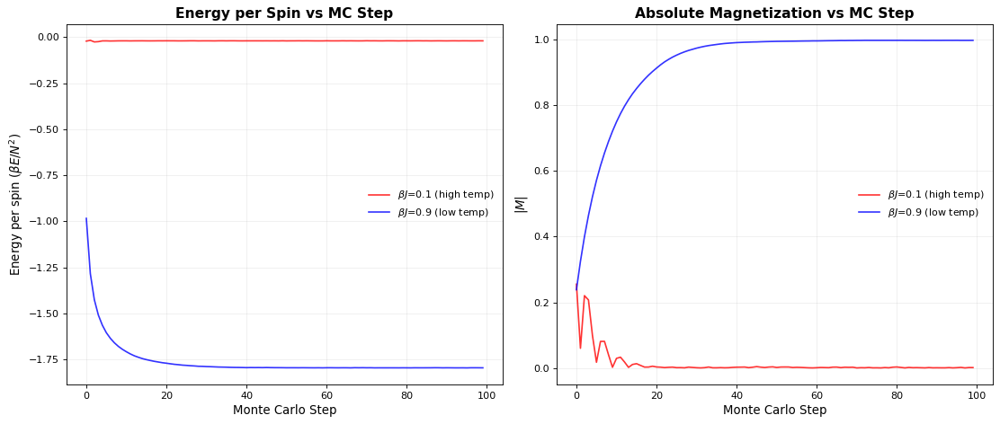

In [4]:
# Static plots - Energy and Magnetization
fig2, ax2 = plt.subplots(1, 2, figsize=(14, 6))

# Energy plot
ax2[0].plot(np.arange(tsteps), MC_energy1/L**2, c='red', 
           label=f'$\\beta J$={bJ[0]:.1f} (high temp)', alpha=0.8)
ax2[0].plot(np.arange(tsteps), MC_energy2/L**2, c='blue', 
           label=f'$\\beta J$={bJ[1]:.1f} (low temp)', alpha=0.8)
ax2[0].set_title('Energy per Spin vs MC Step', fontsize=14, fontweight='bold')
ax2[0].set_xlabel('Monte Carlo Step', fontsize=12)
ax2[0].set_ylabel('Energy per spin ($\\beta E/N^2$)', fontsize=12)
ax2[0].legend(frameon=False)
ax2[0].grid(alpha=0.2)

# Magnetization plot
ax2[1].plot(np.arange(tsteps), np.abs(MC_magnetization1), c='red', 
           label=f'$\\beta J$={bJ[0]:.1f} (high temp)', alpha=0.8)
ax2[1].plot(np.arange(tsteps), np.abs(MC_magnetization2), c='blue', 
           label=f'$\\beta J$={bJ[1]:.1f} (low temp)', alpha=0.8)
ax2[1].set_title('Absolute Magnetization vs MC Step', fontsize=14, fontweight='bold')
ax2[1].set_xlabel('Monte Carlo Step', fontsize=12)
ax2[1].set_ylabel('$|M|$', fontsize=12)
ax2[1].legend(frameon=False)
ax2[1].grid(alpha=0.2)

plt.tight_layout()
plt.show()

#### **Equilibration and Finite Size Effects**

In our simulation of a large lattice ($N = 1000 \times 1000 = 10^6$ spins), we observe that the spin configuration converges to a steady state after approximately 50 Monte Carlo (MC) steps. This initial period, known as equilibration or thermalization, allows the system to relax from its artificial initial condition (e.g., all spins aligned) to the thermal equilibrium state dictated by the Boltzmann distribution.

**Impact of System Size**

- **Convergence Time:** Smaller systems generally reach equilibrium faster. Larger systems typically require more time to relax, particularly near the critical temperature where correlation lengths diverge (Critical Slowing Down).

- **Fluctuations:** Once in equilibrium, smaller systems exhibit significantly larger relative fluctuations in observables like magnetization. This is a standard result of statistical mechanics, where relative fluctuations typically scale as $1/\sqrt{N}$.

We must ensure our measurements reflect the true equilibrium properties of the system, not the arbitrary initial conditions. Including the initial "burn-in" phase in our averages would introduce systematic bias. To address this during our temperature sweeps, for each temperature, we run the simulation for a set number of steps (e.g., $>50$) and we collect data for averaging only after this equilibration period is complete.

### **2nd case (non-zero magnetic field)**

In [5]:
# Initialize systems with parameters for ordered/disordered comparison
params3 = sys_params(L, bJ[0], h[1])  # bJ=0.1, h=0.6
params4 = sys_params(L, bJ[1], h[1])  # bJ=0.9, h=0.6

# Lattice initialization (ordered vs disordered):
params3.init_lattice(0.95, spin_type='down')  # 95% down-spins (ordered)
params4.init_lattice(0.55, spin_type='down')  # 55% down-spins (disordered)

# Create simulation instances
sim3 = MetropolisIsing(params3)
sim4 = MetropolisIsing(params4)

# Run Monte-Carlo simulations
MC_spins3, MC_energy3, MC_magnetization3 = sim3.simulate(tsteps, partition, save_spins=True)
MC_spins4, MC_energy4, MC_magnetization4 = sim4.simulate(tsteps, partition, save_spins=True)

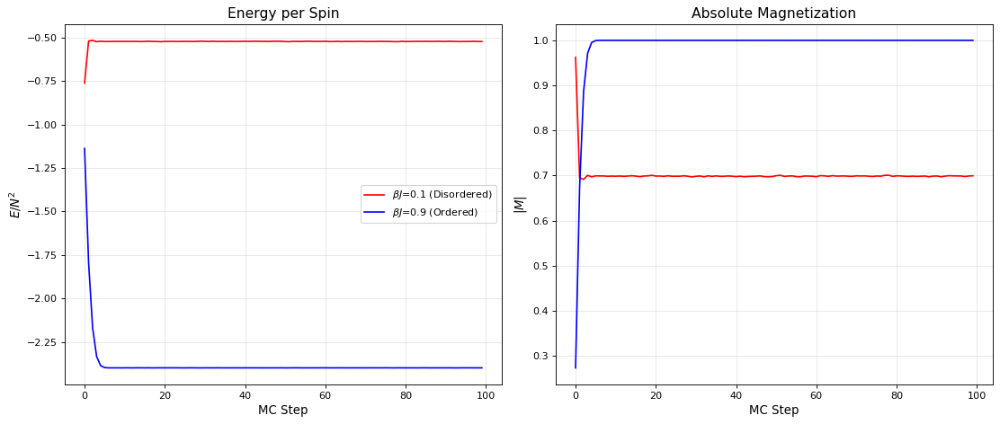

In [6]:
# Animation of lattice evolution
fig3, ax3 = plt.subplots(1, 2, figsize=(14, 6))
plt.suptitle(f"Monte-Carlo simulation of the 2D Ising model ({L**2} spins)", 
             fontsize=16, fontweight='bold')

# Initial frames
lat3 = ax3[0].imshow(MC_spins3[0], cmap='coolwarm', vmin=-1, vmax=1)
lat4 = ax3[1].imshow(MC_spins4[0], cmap='coolwarm', vmin=-1, vmax=1)
ax3[0].set_title(f"$\\beta J$={bJ[0]:.1f}, $h$={h[1]:.1f} (Disordered)", fontsize=12)
ax3[1].set_title(f"$\\beta J$={bJ[1]:.1f}, $h$={h[1]:.1f} (Ordered)", fontsize=12)
plt.tight_layout()

def update(frame):
    lat3.set_array(MC_spins3[frame])
    lat4.set_array(MC_spins4[frame])
    ax3[0].set_title(f"$\\beta J$={bJ[0]:.1f}, $h$={h[1]:.1f} - Step {frame*partition}")
    ax3[1].set_title(f"$\\beta J$={bJ[1]:.1f}, $h$={h[1]:.1f} - Step {frame*partition}")
    return lat3, lat4,

animation = FuncAnimation(
    fig3,
    update,
    frames=min(len(MC_spins3), len(MC_spins4)),
    interval=200,
    blit=True
)

# Energy and magnetization plots
fig4, ax4 = plt.subplots(1, 2, figsize=(14, 6))

# Energy plot (per spin)
ax4[0].plot(MC_energy3/L**2, c='red', label=f'$\\beta J$={bJ[0]:.1f} (Disordered)')
ax4[0].plot(MC_energy4/L**2, c='blue', label=f'$\\beta J$={bJ[1]:.1f} (Ordered)')
ax4[0].set_title('Energy per Spin', fontsize=14)
ax4[0].set_xlabel('MC Step', fontsize=12)
ax4[0].set_ylabel('$E/N^2$', fontsize=12)
ax4[0].legend()
ax4[0].grid(alpha=0.3)

# Magnetization plot (absolute)
ax4[1].plot(np.abs(MC_magnetization3), c='red')
ax4[1].plot(np.abs(MC_magnetization4), c='blue')
ax4[1].set_title('Absolute Magnetization', fontsize=14)
ax4[1].set_xlabel('MC Step', fontsize=12)
ax4[1].set_ylabel('$|M|$', fontsize=12)
ax4[1].grid(alpha=0.3)

plt.tight_layout()

# Display results
display(HTML(animation.to_html5_video()))
display(fig4)
plt.close('all')

In this part we see that the lattice magnetization converges even faster to the predicted spin configuration ($<10$ MC steps), compared to the zero magnetic field case. This is expected, as the magnetic field strongly influences the spin to align towards its direction.

### **2nd part: Temperature-sweep of the 2D Ising model and comparison of finite size effects**

In this part we study how a 2D Ising model evolves over time by gradually changing the temperature of the system. We calculate the temperature dependence of the magnetization ($m$), magnetic susceptibility ($\chi$), and specific heat per spin ($c_h$) by using:

1. **The Metropolis algorithm.**
2. **The Swendsen-Wang cluster algorithm.**

We do this by using different lattice sizes, so that we can compare finite size effects. In the case of an infinite lattice, the thermodynamic observables must diverge very sharply at the transition point. By decreasing the lattice size we will see how this affects the temperature dependence of the observables.

**Finite Size Scaling:**
A true phase transition, characterized by a divergence in observables like $\chi$ and $c_h$, occurs only in the thermodynamic limit where the system size $N \to \infty$. In computer simulations, we are inherently limited to finite lattices of linear dimension $L$ (where $N = L \times L$).

We perform simulations for different lattice sizes (e.g., $L=10, 20, 100$) to observe Finite Size Effects:

- **Correlation Length Limiting:** Near the critical temperature $T_c$, the correlation length $\xi$ of spin fluctuations diverges ($\xi \to \infty$). However, in a finite system, $\xi$ cannot exceed the system size $L$. This cutoff prevents true divergences.

- **Peak Rounding and Shifting:** Instead of a sharp singularity at $T_c$, we observe rounded peaks with finite maximum values. As $L$ increases, these peaks become sharper and taller, and their positions shift closer to the true theoretical critical temperature $T_c \approx 2.269 J/k_B$.

## Main Simulation

### Implementation of the **Metropolis** algorithm with error calculation

In [7]:
# System parameters
L_values = [10, 20, 100]
tsteps = 10000
h = 0.0

# Temperature sweep parameters (bJ values)
bJparams = np.concatenate([
    np.linspace(0.8, 0.5, 15),
    np.linspace(0.5, 0.4, 30), 
    np.linspace(0.4, 0.25, 15)
])

# Dictionary to store raw time series data for each L
# Structure: raw_data[L] = {'E': energy_series, 'M': mag_series}
raw_data = {}

print(f"Running Metropolis algorithm for L = {L_values}")

for L in L_values:
    print(f"\nSimulating Lattice L={L}...")
    
    # Initialize system parameters for this specific L
    params = sys_params(L, bJparams[0], h)

    # Lattice initialization (up/down spins)
    params.init_lattice(0.9, spin_type='up')

    # Create simulation instance
    sim = MetropolisIsing(params)

    # Run temperature sweep
    _, E, M = sim.temperature_sweep(bJparams, tsteps, partition, save_spins=False)
    
    # Store the results
    raw_data[L] = {'E': E, 'M': M}

Running Metropolis algorithm for L = [10, 20, 100]

Simulating Lattice L=10...


Temperature sweep: 100%|██████████| 60/60 [00:06<00:00,  9.41it/s]



Simulating Lattice L=20...


Temperature sweep: 100%|██████████| 60/60 [00:12<00:00,  4.92it/s]



Simulating Lattice L=100...


Temperature sweep: 100%|██████████| 60/60 [03:13<00:00,  3.23s/it]


### Calculation of **magnetization**, **susceptibility**, and **specific heat**

In [8]:
# Dictionary to store processed plotting data for each L
plot_data = {}

t_discard = 100 / tsteps

print("Analyzing data...")

for L in L_values:
    E_series = raw_data[L]['E']
    M_series = raw_data[L]['M']
    
    magnetization, magnetization_error = [], []
    susceptibility, susceptibility_error = [], []
    specific_heat, specific_heat_error = [], []

    for i, bJ in enumerate(bJparams):
        beta = bJ 
        
        # Magnetization & Susceptibility
        M_data = M_series[i][int(t_discard * len(M_series[i])):]  # Discard first MC steps up to t_discard
        
        tau_M = err.iat_error(M_data, max_lag=500)[0]
        tau_M = 5 if np.isnan(tau_M) else int(tau_M)
        
        M_blocks = err.data_blocking(M_data, tau_M)[2]
        M_boot = err.block_bootstrap(M_blocks, num_resamples=5000)
        
        m_mean = np.mean(M_boot, axis=1)
        m_sq = np.mean(M_boot**2, axis=1)
        
        magnetization.append(np.mean(M_blocks))
        magnetization_error.append(np.std(m_mean))
        
        # Susceptibility
        chi = beta * (L**2) * (m_sq - m_mean**2)
        susceptibility.append(np.mean(chi))
        susceptibility_error.append(np.std(chi))

        # Specific Heat
        E_data = E_series[i][int(t_discard * len(E_series[i])):]
        
        tau_E = err.iat_error(E_data, max_lag=500)[0]
        tau_E = max(1, int(5 if np.isnan(tau_E) else tau_E))

        E_blocks = err.data_blocking(E_data, tau_E)[2]
        E_boot = err.block_bootstrap(E_blocks, num_resamples=5000)

        e_mean = np.mean(E_boot, axis=1)
        e_sq = np.mean(E_boot**2, axis=1)
        
        # Cv formula: (beta^2 / L^2) * (<E^2> - <E>^2)
        Cv = (e_sq - e_mean**2) * (bJ**2 / L**2)
        specific_heat.append(np.mean(Cv))
        specific_heat_error.append(np.std(Cv, ddof=1))

    # Store arrays in the results dictionary
    plot_data[L] = {
        'mag': np.array(magnetization),
        'mag_err': np.array(magnetization_error),
        'chi': np.array(susceptibility),
        'chi_err': np.array(susceptibility_error),
        'cv': np.array(specific_heat),
        'cv_err': np.array(specific_heat_error)
    }
    print(f"Finished analysis for L={L}")

Analyzing data...
Finished analysis for L=10
Finished analysis for L=20


c:\Users\vas1l\Documents\GitHub\2D-Ising-model-Monte-Carlo\error_analysis.py:67: RuntimeWarning: auto_window fallback triggered: using full ACF window (no cutoff found). Consider increasing max_lag or reducing c.
  warnings.warn(
c:\Users\vas1l\Documents\GitHub\2D-Ising-model-Monte-Carlo\error_analysis.py:161: RuntimeWarning: invalid value encountered in sqrt
  error = np.sqrt((mean_sq_blocked - mean_blocked**2) / (num_blocks - 1))


Finished analysis for L=100


### Plotting

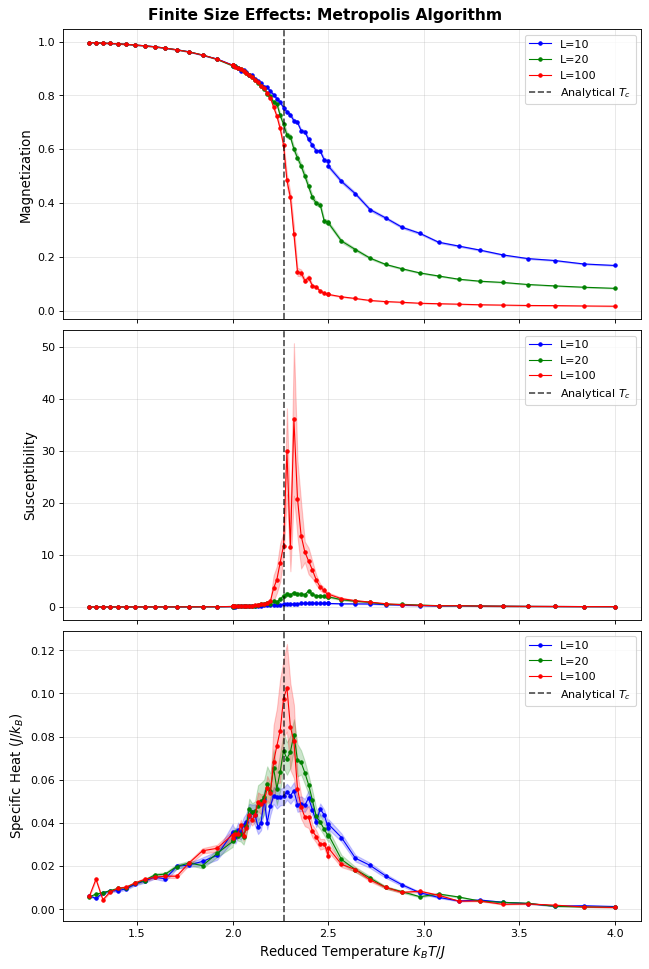

In [9]:
# Analytic calculation of the critical point in 2D ising model
Tc_analytical = 2.0 / np.log(1.0 + np.sqrt(2.0))

reduced_temp = 1 / bJparams
fig, axs = plt.subplots(3, 1, figsize=(8, 12), sharex=True, constrained_layout=True)
plt.suptitle('Finite Size Effects: Metropolis Algorithm', fontsize=14, fontweight='bold')

# Colors for different lattice sizes
colors = ['blue', 'green', 'red']

for idx, L in enumerate(L_values):
    data = plot_data[L]
    c = colors[idx % len(colors)]
    label_str = f'L={L}'
    
    # 1. Magnetization
    axs[0].plot(reduced_temp, data['mag'], 'o-', markersize=3, label=label_str, color=c, lw=1)
    axs[0].fill_between(reduced_temp, 
                        data['mag'] - data['mag_err'], 
                        data['mag'] + data['mag_err'], 
                        color=c, alpha=0.2)

    # 2. Susceptibility
    axs[1].plot(reduced_temp, data['chi'], 'o-', markersize=3, label=label_str, color=c, lw=1)
    axs[1].fill_between(reduced_temp, 
                        data['chi'] - data['chi_err'], 
                        data['chi'] + data['chi_err'], 
                        color=c, alpha=0.2)

    # 3. Specific Heat
    axs[2].plot(reduced_temp, data['cv'], 'o-', markersize=3, label=label_str, color=c, lw=1)
    axs[2].fill_between(reduced_temp, 
                        data['cv'] - data['cv_err'], 
                        data['cv'] + data['cv_err'], 
                        color=c, alpha=0.2)

# Formatting axes
axs[0].set_ylabel("Magnetization", fontsize=12)
axs[0].axvline(x=Tc_analytical, color='k', linestyle='--', label='Analytical $T_c$', alpha=0.7)
axs[0].grid(True, alpha=0.3)
axs[0].legend()

axs[1].set_ylabel("Susceptibility", fontsize=12)
axs[1].axvline(x=Tc_analytical, color='k', linestyle='--', label='Analytical $T_c$', alpha=0.7)
axs[1].grid(True, alpha=0.3)
axs[1].legend()

axs[2].set_ylabel("Specific Heat ($J/k_B$)", fontsize=12)
axs[2].set_xlabel("Reduced Temperature $k_B T / J$", fontsize=12)
axs[2].axvline(x=Tc_analytical, color='k', linestyle='--', label='Analytical $T_c$', alpha=0.7)
axs[2].grid(True, alpha=0.3)
axs[2].legend()

plt.show()

### Implementation of the **Swendsen-Wang** algorithm with error calculation

In [10]:
# System parameters
L_values = [10, 20, 100]
tsteps = 10000
partition = 1000 
h = 0.0

# Temperature sweep parameters (bJ values)
bJparams = np.concatenate([
    np.linspace(0.8, 0.5, 15),
    np.linspace(0.5, 0.4, 30), 
    np.linspace(0.4, 0.25, 15)
])

# Dictionary to store raw time series data for each L
# Structure: raw_data[L] = {'E': energy_series, 'M': mag_series}
raw_data = {}

print(f"Running SW algorithm for L = {L_values}")

for L in L_values:
    print(f"\nSimulating Lattice L={L}...")
    
    # Initialize system parameters for this specific L
    params = sys_params(L, bJparams[0], h)

    # Lattice initialization (up/down spins)
    params.init_lattice(0.9, spin_type='up')

    # Create simulation instance
    sim = SWIsing(params)

    # Run temperature sweep
    _, E, M = sim.temperature_sweep(bJparams, tsteps, partition, save_spins=False)
    
    # Store the results
    raw_data[L] = {'E': E, 'M': M}

Running SW algorithm for L = [10, 20, 100]

Simulating Lattice L=10...


Temperature sweep: 100%|██████████| 60/60 [00:08<00:00,  7.02it/s]



Simulating Lattice L=20...


Temperature sweep: 100%|██████████| 60/60 [00:16<00:00,  3.62it/s]



Simulating Lattice L=100...


Temperature sweep: 100%|██████████| 60/60 [04:55<00:00,  4.92s/it]


### Calculation of **magnetization**, **susceptibility**, and **specific heat**

In [11]:
# Dictionary to store processed plotting data for each L
plot_data = {}

t_discard = 100 / tsteps

print("Analyzing data...")

for L in L_values:
    E_series = raw_data[L]['E']
    M_series = raw_data[L]['M']
    
    magnetization, magnetization_error = [], []
    susceptibility, susceptibility_error = [], []
    specific_heat, specific_heat_error = [], []

    for i, bJ in enumerate(bJparams):
        beta = bJ 
        
        # Magnetization & Susceptibility
        M_data = M_series[i][int(t_discard * len(M_series[i])):]  # Discard first MC steps up to t_discard
        
        tau_M = err.iat_error(M_data, max_lag=500)[0]
        tau_M = 5 if np.isnan(tau_M) else int(tau_M)
        
        M_blocks = err.data_blocking(M_data, tau_M)[2]
        M_boot = err.block_bootstrap(M_blocks, num_resamples=5000)
        
        m_mean = np.mean(M_boot, axis=1)
        m_sq = np.mean(M_boot**2, axis=1)
        
        magnetization.append(np.mean(M_blocks))
        magnetization_error.append(np.std(m_mean))
        
        # Susceptibility formula: beta * L^2 * (<m^2> - <m>^2)
        chi = beta * (L**2) * (m_sq - m_mean**2)
        susceptibility.append(np.mean(chi))
        susceptibility_error.append(np.std(chi))

        # Specific Heat
        E_data = E_series[i][int(t_discard * len(E_series[i])):]
        
        tau_E = err.iat_error(E_data, max_lag=500)[0]
        tau_E = max(1, int(5 if np.isnan(tau_E) else tau_E))

        E_blocks = err.data_blocking(E_data, tau_E)[2]
        E_boot = err.block_bootstrap(E_blocks, num_resamples=5000)

        e_mean = np.mean(E_boot, axis=1)
        e_sq = np.mean(E_boot**2, axis=1)
        
        # Cv formula: (beta^2 / L^2) * (<E^2> - <E>^2)
        Cv = (e_sq - e_mean**2) * (bJ**2 / L**2)
        specific_heat.append(np.mean(Cv))
        specific_heat_error.append(np.std(Cv, ddof=1))

    # Store arrays in the results dictionary
    plot_data[L] = {
        'mag': np.array(magnetization),
        'mag_err': np.array(magnetization_error),
        'chi': np.array(susceptibility),
        'chi_err': np.array(susceptibility_error),
        'cv': np.array(specific_heat),
        'cv_err': np.array(specific_heat_error)
    }
    print(f"Finished analysis for L={L}")

Analyzing data...
Finished analysis for L=10
Finished analysis for L=20


c:\Users\vas1l\Documents\GitHub\2D-Ising-model-Monte-Carlo\error_analysis.py:161: RuntimeWarning: invalid value encountered in sqrt
  error = np.sqrt((mean_sq_blocked - mean_blocked**2) / (num_blocks - 1))


Finished analysis for L=100


### Plotting

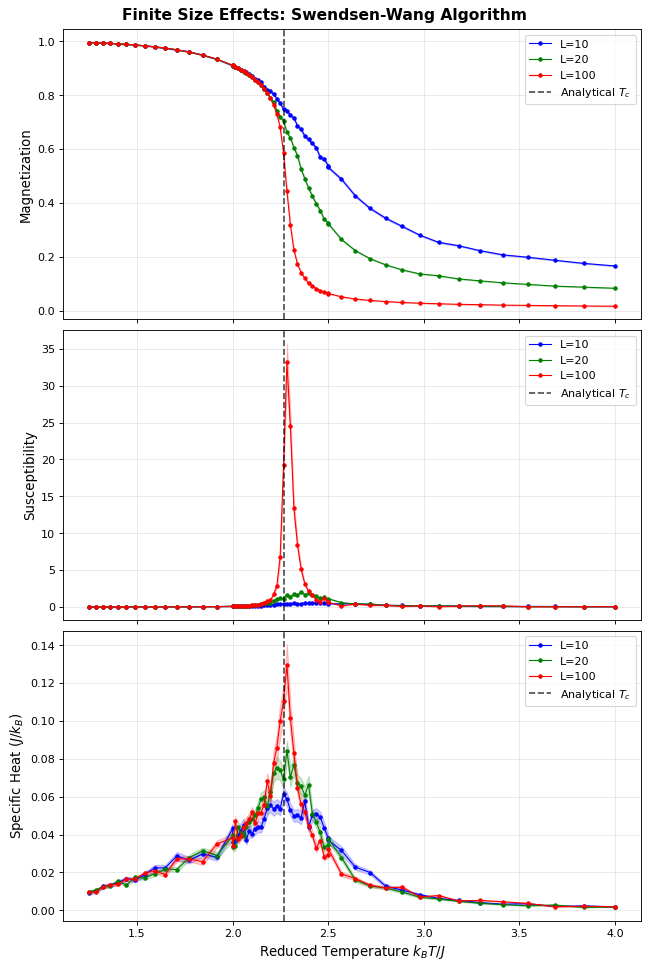

In [12]:
# Analytic calculation of the critical point in 2D ising model
Tc_analytical = 2.0 / np.log(1.0 + np.sqrt(2.0))

reduced_temp = 1 / bJparams
fig, axs = plt.subplots(3, 1, figsize=(8, 12), sharex=True, constrained_layout=True)
plt.suptitle('Finite Size Effects: Swendsen-Wang Algorithm', fontsize=14, fontweight='bold')

# Colors for different lattice sizes
colors = ['blue', 'green', 'red']

for idx, L in enumerate(L_values):
    data = plot_data[L]
    c = colors[idx % len(colors)]
    label_str = f'L={L}'
    
    # 1. Magnetization
    axs[0].plot(reduced_temp, data['mag'], 'o-', markersize=3, label=label_str, color=c, lw=1)
    axs[0].fill_between(reduced_temp, 
                        data['mag'] - data['mag_err'], 
                        data['mag'] + data['mag_err'], 
                        color=c, alpha=0.2)

    # 2. Susceptibility
    axs[1].plot(reduced_temp, data['chi'], 'o-', markersize=3, label=label_str, color=c, lw=1)
    axs[1].fill_between(reduced_temp, 
                        data['chi'] - data['chi_err'], 
                        data['chi'] + data['chi_err'], 
                        color=c, alpha=0.2)

    # 3. Specific Heat
    axs[2].plot(reduced_temp, data['cv'], 'o-', markersize=3, label=label_str, color=c, lw=1)
    axs[2].fill_between(reduced_temp, 
                        data['cv'] - data['cv_err'], 
                        data['cv'] + data['cv_err'], 
                        color=c, alpha=0.2)

# Formatting axes
axs[0].set_ylabel("Magnetization", fontsize=12)
axs[0].axvline(x=Tc_analytical, color='k', linestyle='--', label='Analytical $T_c$', alpha=0.7)
axs[0].grid(True, alpha=0.3)
axs[0].legend()

axs[1].set_ylabel("Susceptibility", fontsize=12)
axs[1].axvline(x=Tc_analytical, color='k', linestyle='--', label='Analytical $T_c$', alpha=0.7)
axs[1].grid(True, alpha=0.3)
axs[1].legend()

axs[2].set_ylabel("Specific Heat ($J/k_B$)", fontsize=12)
axs[2].set_xlabel("Reduced Temperature $k_B T / J$", fontsize=12)
axs[2].axvline(x=Tc_analytical, color='k', linestyle='--', label='Analytical $T_c$', alpha=0.7)
axs[2].grid(True, alpha=0.3)
axs[2].legend()

plt.show()

### **Conclusions**

The temperature sweep simulations confirmed the expected behavior of the 2D Ising model under finite size constraints and highlighted the importance of selecting the appropriate Monte Carlo algorithm near the phase transition.

**Finite Size Effects:**
We observed that thermodynamic observables such as magnetization, susceptibility, and specific heat, display increasing fidelity to the theoretical infinite-lattice model as the size $L$ increases ($L=10 \to L=100$). The characteristic divergences predicted by theory are replaced by finite peaks.
* As $L$ increases, the magnetization goes from non-zero ($T<T_c$) to zero ($T>T_c$) more **sharply** around $T_c$.
* As $L$ increases, the peaks in $\chi$ and $C_v$ become significantly **sharper and taller**, and their maximum values move closer to the analytical critical temperature ($T_c \approx 2.269 J/k_B$).
* This demonstrates that the correlation length ($\xi$) is constrained by the system size ($L$) and that true critical behavior is only recovered in the thermodynamic limit.

**Algorithmic Superiority (Metropolis vs. Swendsen-Wang):**
The analysis of statistical errors (the faint areas around the curves) vividly confirms the superiority of the Swendsen-Wang (SW) algorithm near $T_c$.

* **Metropolis:** Due to **critical slowing down** ($z \approx 2.17$), the Metropolis algorithm produces wide, noticeable error bars around $T_c$ because the system takes too long to fully decorrelate, yielding few statistically independent samples.
* **Swendsen-Wang:** By flipping large clusters whose size scales with the correlation length ($\xi$), SW drastically reduces the dynamic critical exponent ($z \approx 0.35$). Consequently, the SW algorithm generates statistically independent samples much faster, resulting in **noticeably smaller errors** in $\chi$ and $c_h$ near the peak.

The ability of the SW algorithm to obtain highly precise data points around $T_c$ is essential for reliable **critical exponent estimation**. While that full analysis was beyond the scope of this project, the clear reduction in statistical error confirms the efficiency of the SW cluster approach.